# Imports

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import anndata as ad

plt.rcParams['figure.figsize'] = (15, 15)
from scipy.stats import median_abs_deviation

# r packages
#import anndata2ri
#import logging
#import rpy2.rinterface_lib.callbacks as rcb
#import rpy2.robjects as ro

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,

)

# Raw data processing 


## Create anndata object from count file

In [2]:
counts = pd.read_csv('/home/p/pohll/Desktop/MP/data/xie/GSE104154_d0_d21_sma_tm_Expr_raw.csv', index_col='id')

In [3]:
counts.head()

,symbol,AAACCTGAGGACATTA-1,AAACCTGCAGTCGTGC-1,AAACCTGCATGAAGTA-1,AAACCTGTCTCGCATC-1,AAACGGGTCCTAGAAC-1,AAACGGGTCTAAGCCA-1,AAAGCAAAGGACTGGT-1,AAAGCAAGTAGGCATG-1,AAAGCAAGTGTTGAGG-1,...,TTGTAGGCAAAGCAAT-6,TTGTAGGGTCAATACC-6,TTGTAGGTCCCATTTA-6,TTTACTGCAACACCTA-6,TTTACTGTCTGGCGAC-6,TTTCCTCGTTTAGGAA-6,TTTGCGCCAATGAAAC-6,TTTGGTTCAGTAGAGC-6,TTTGTCAAGCTACCGC-6,TTTGTCACATCGGGTC-6
id,,,,,,,,,,,,,,,,,,,,,
ENSMUSG00000051951,Xkr4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000089699,Gm1992,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000102343,Gm37381,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000025900,Rp1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000109048,Rp1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
counts.shape

(27998, 10411)

10411 barcodes (cells, obs), 27998 genes (vars)

In [5]:
counts.index = counts.symbol
counts = counts.drop('symbol', axis=1)

In [6]:
xie_csv = ad.AnnData(counts)

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
xie_csv.obs_names_make_unique()

In [8]:
xie_csv = xie_csv.T

## Add annotation 

In [9]:
anno_ctrl = pd.read_excel('/home/p/pohll/Desktop/MP/data/xie/GSE104154_cell_type_annotation_d0_d21.xlsx', sheet_name=1, index_col='Barcode')
anno_bleo = pd.read_excel('/home/p/pohll/Desktop/MP/data/xie/GSE104154_cell_type_annotation_d0_d21.xlsx', sheet_name=2, index_col='Barcode')

In [10]:
anno_ctrl["defined"].unique()

array(['Col13a1', 'Myofibroblasts', 'Lipofibroblasts', 'Col14a1',
       'Endothelial', 'Methothelial', 'Mesprogenitors'], dtype=object)

In [11]:
anno_xie = pd.concat([anno_ctrl, anno_bleo])

In [12]:
anno_xie.index = anno_xie.index.str.replace(pat='.', repl='-')

In [13]:
xie_csv.obs['annotation']=anno_xie

In [15]:
xie_csv.X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

### show highest expressed genes 

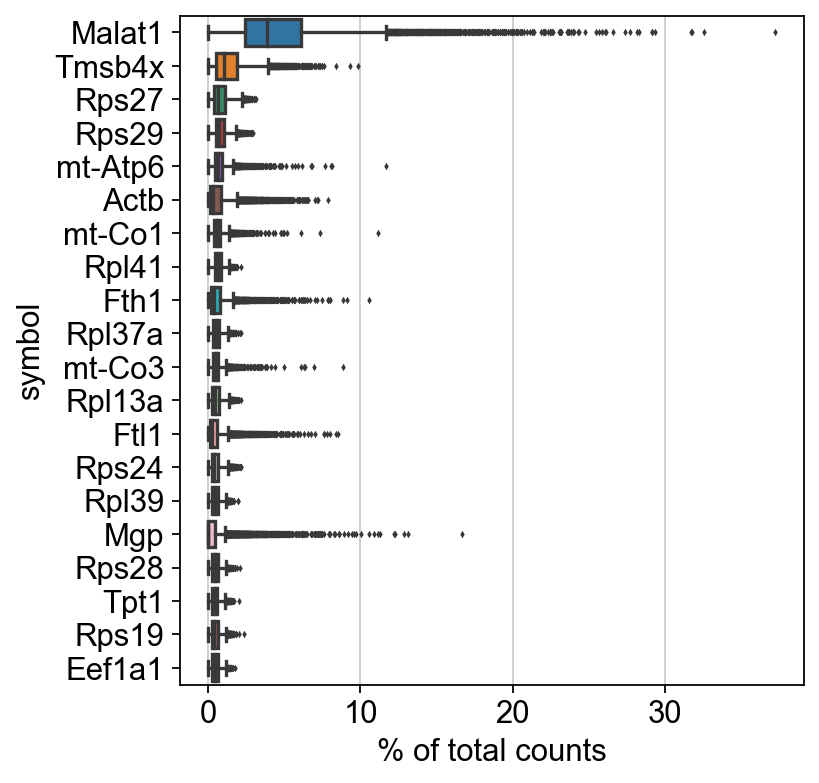

In [18]:
sc.pl.highest_expr_genes(xie_csv, n_top=20)

MALAT1 is the most expressed gene which is frequently detected in poly-A captured scRNA-Seq data, independent of protocol. This gene has been shown to have an inverse correlation with cell health. Especially dead/dying cells have a higher expression of MALAT1.

# Qualitly Control  

## Calculate QC metrics based on mitochondrial, ribosomal, and hemoglobin genes 

In [16]:
# mitochondrial genes
xie_csv.var["mt"] = xie_csv.var_names.str.startswith(("MT-", "mt-"))
# ribosomal genes
xie_csv.var["ribo"] = xie_csv.var_names.str.startswith(("RPS", "RPL", "rps", "rpl"))
# hemoglobin genes.
xie_csv.var["hb"] = xie_csv.var_names.str.contains(("^HB[^(P)]"))

In [17]:
sc.pp.calculate_qc_metrics(
    xie_csv, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
xie_csv

AnnData object with n_obs × n_vars = 10410 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

## QC covariates: 
- n_genes_by_counts in .obs is the number of genes with positive counts in a cell,
- total_counts is the total number of counts for a cell, this might also be known as library size, and
- pct_counts_mt is the proportion of total counts for a cell which are mitochondrial.

Perform QC on each sample

In [19]:
xie_csv.obs['sample']=xie_csv.obs.index.str.split('-').str[1]

In [22]:
plt.rcParams['figure.figsize'] = (7, 7)
samples = ["-1","-2", "-3","-4","-5","-6"]

<AxesSubplot: xlabel='total_counts', ylabel='Count'>

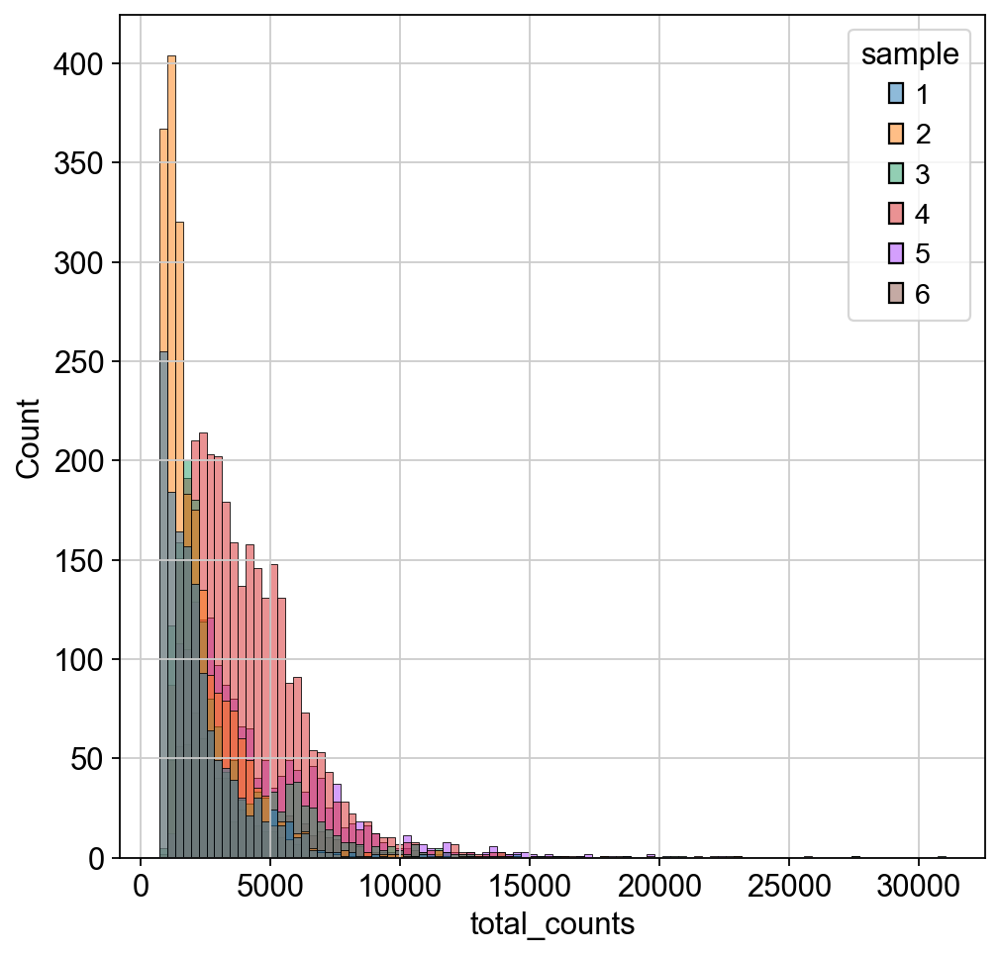

In [20]:
plt.rcParams['figure.figsize'] = (7, 7)
sns.histplot(
    xie_csv.obs, x="total_counts", hue="sample",bins=100, kde=False, legend = True
)

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


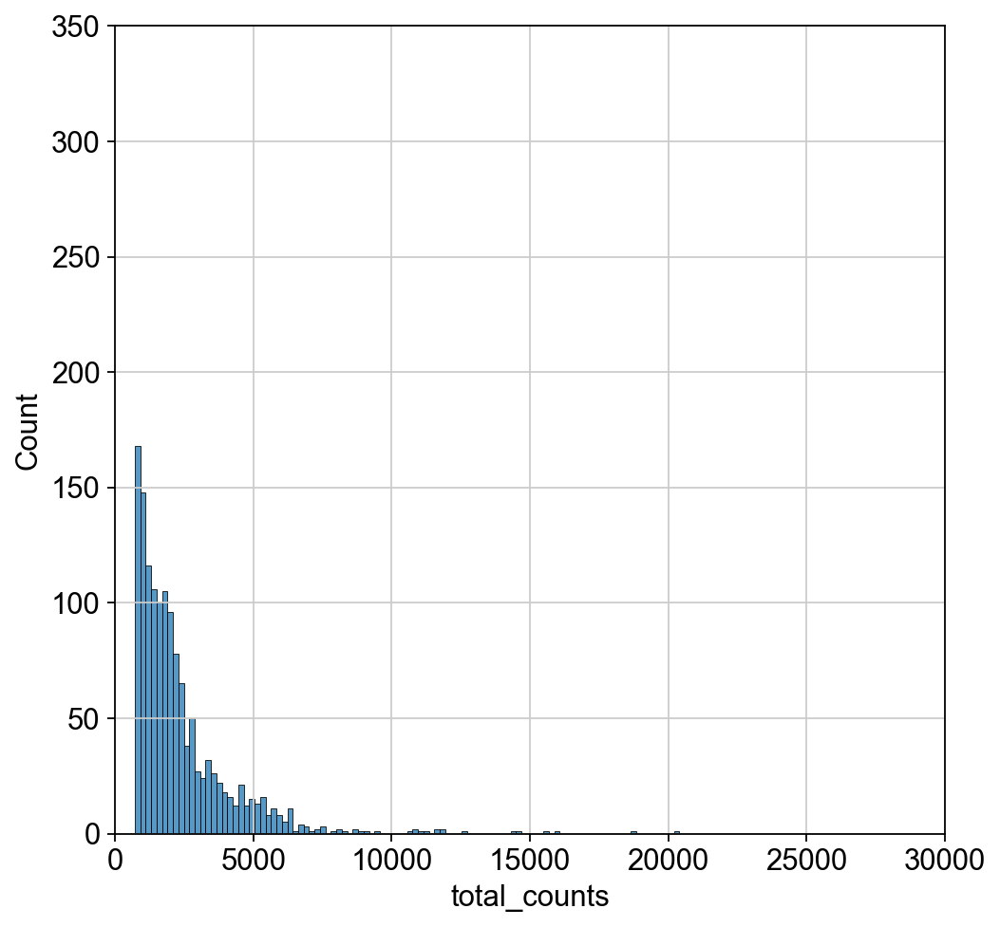

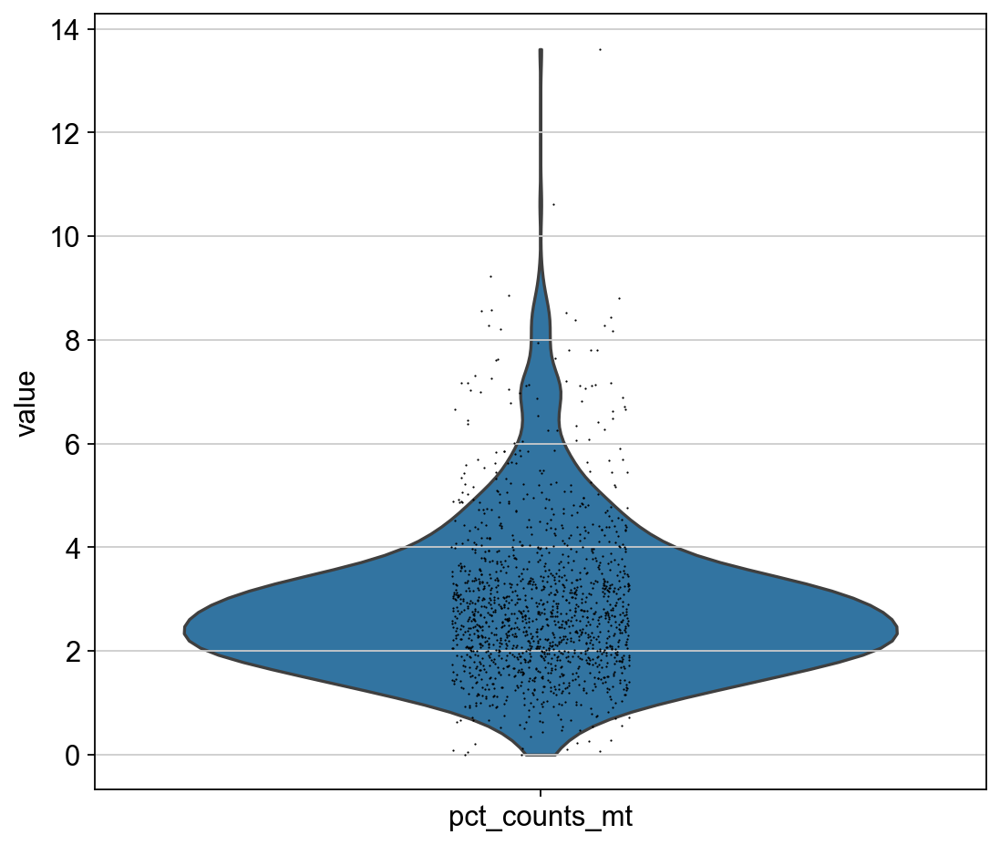

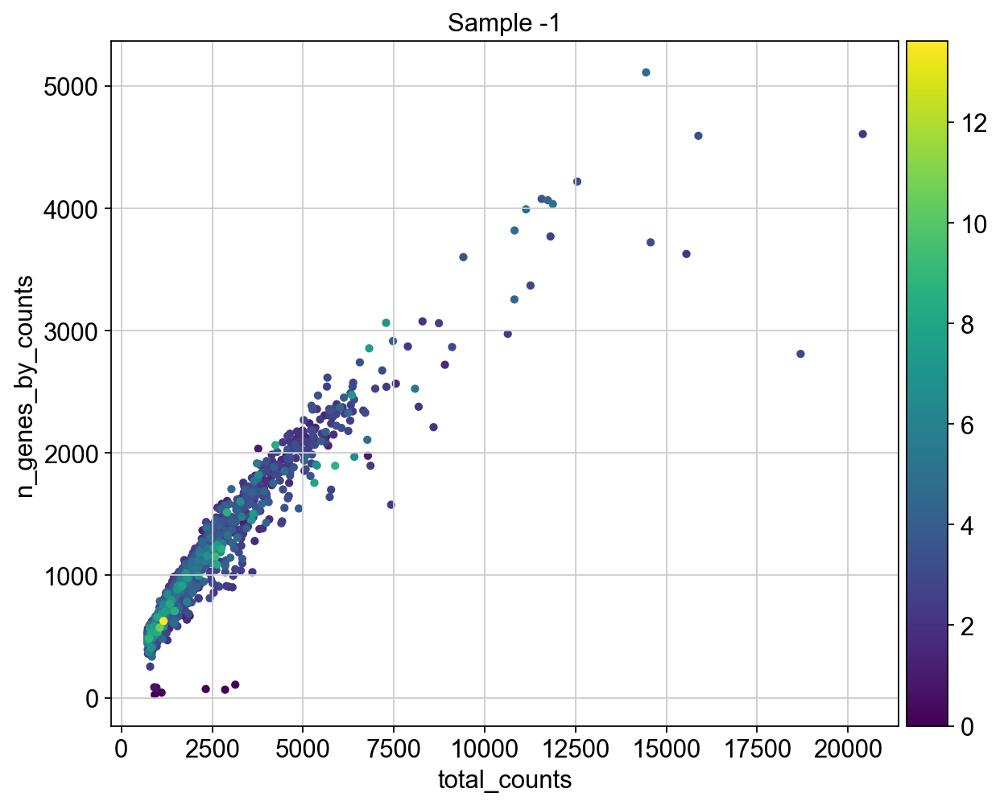

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


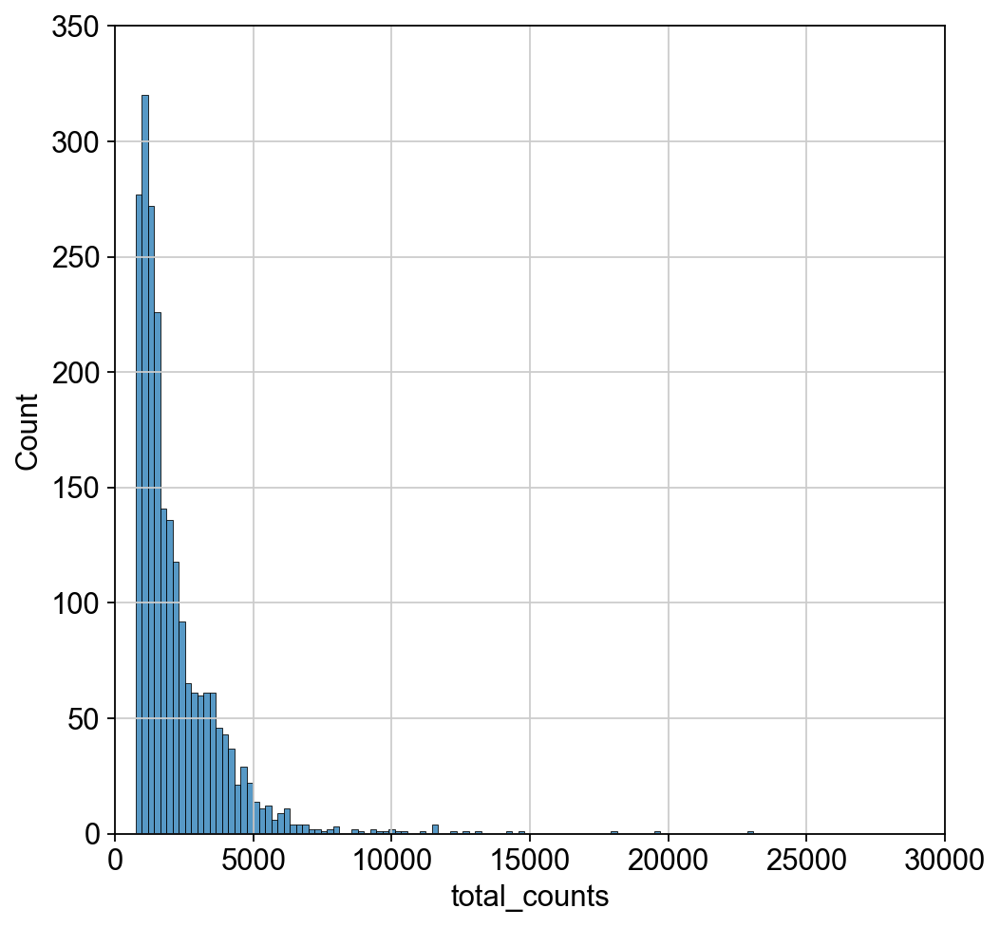

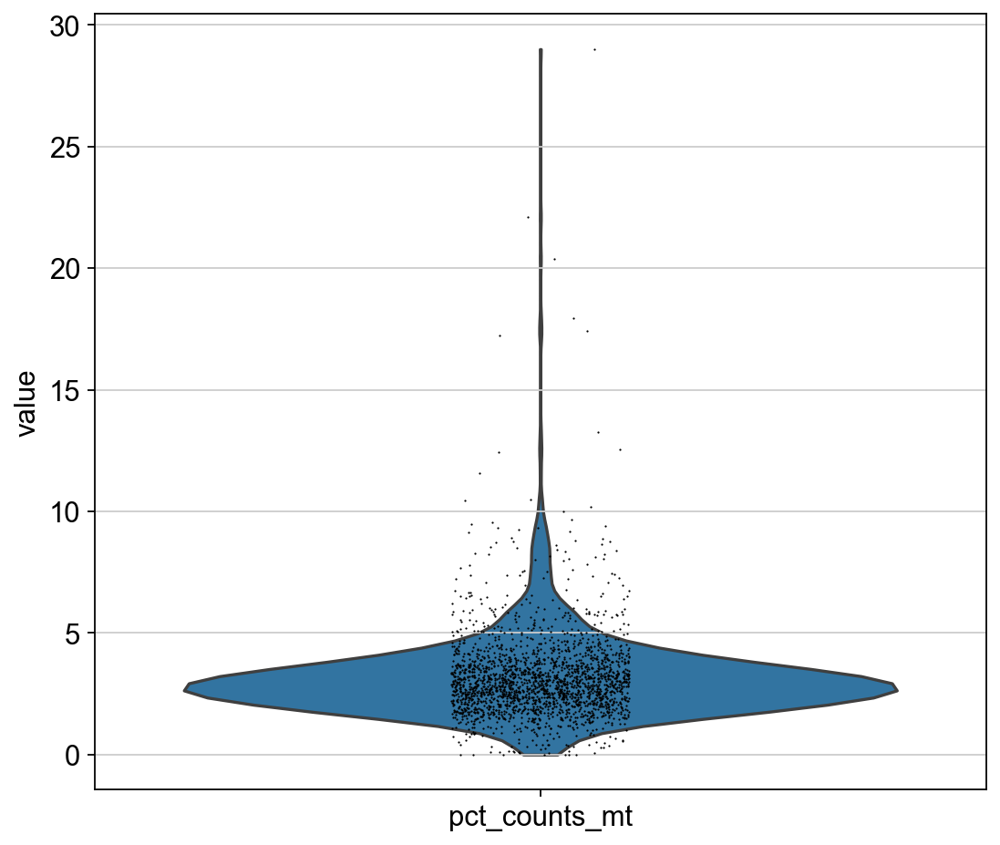

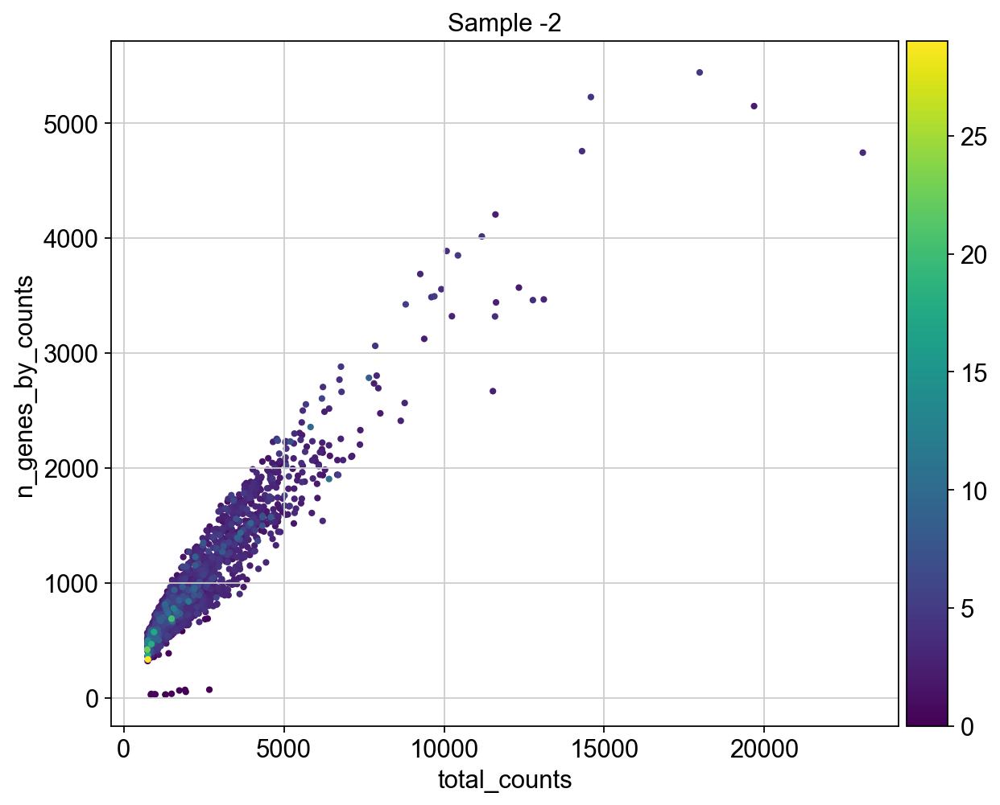

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


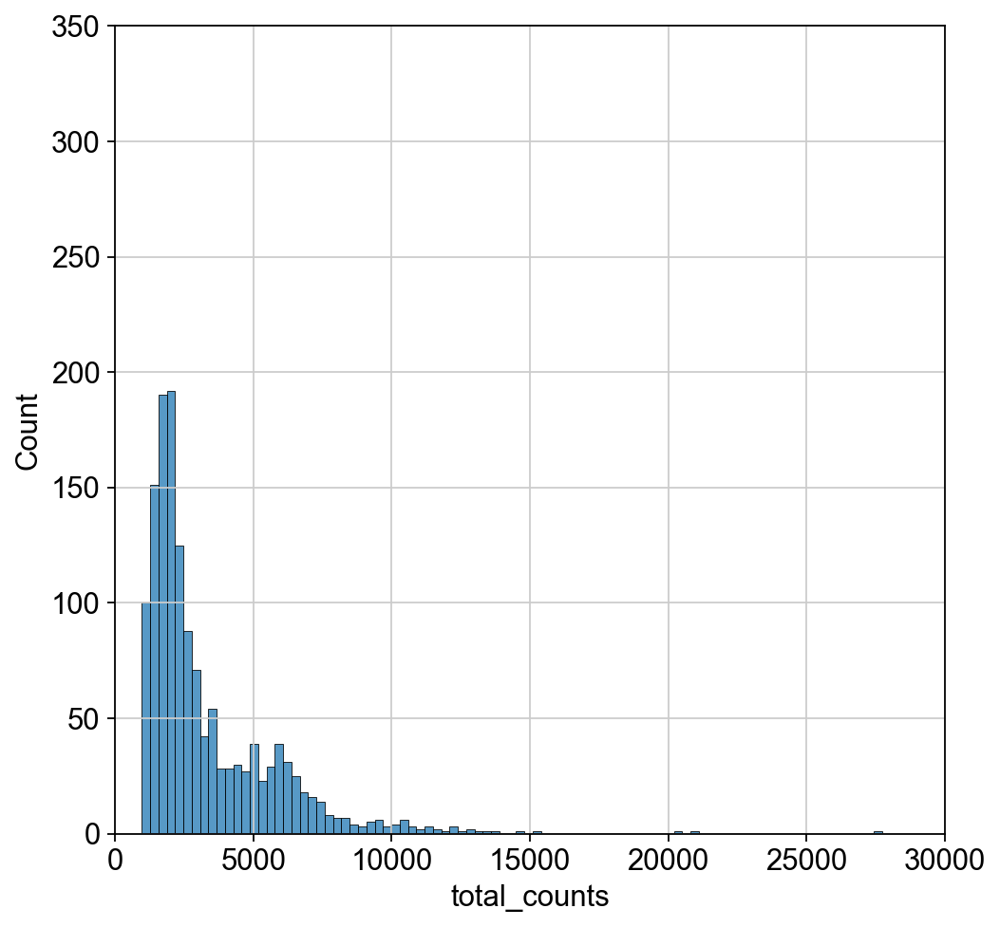

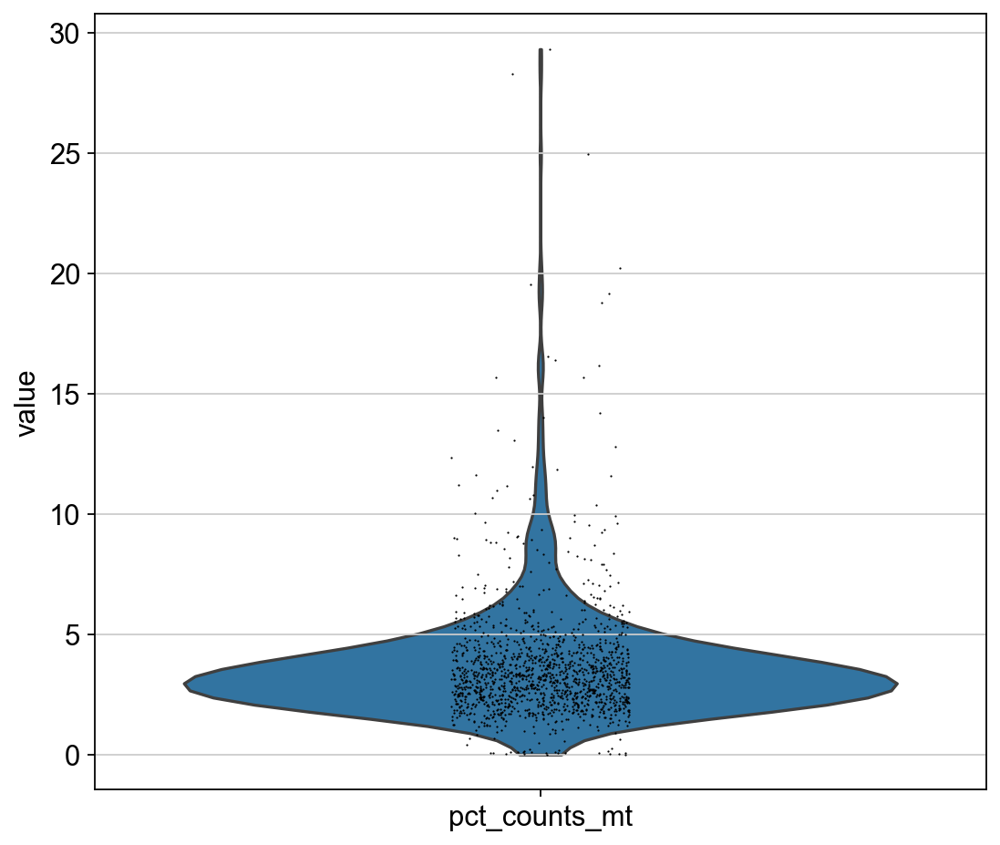

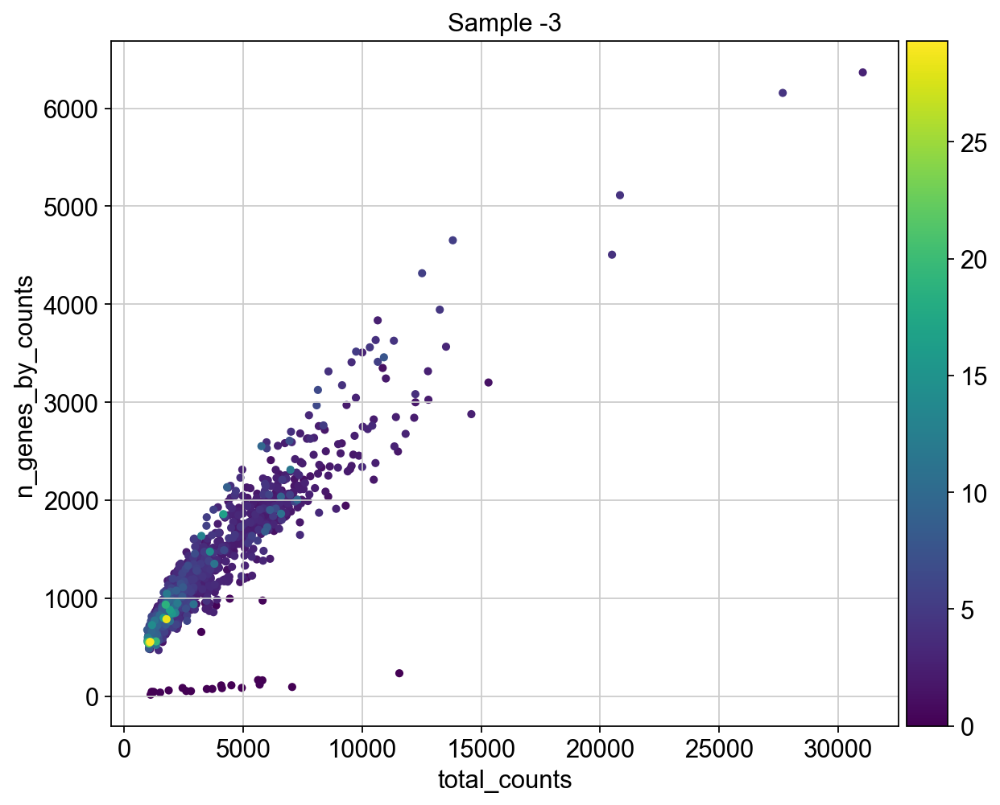

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


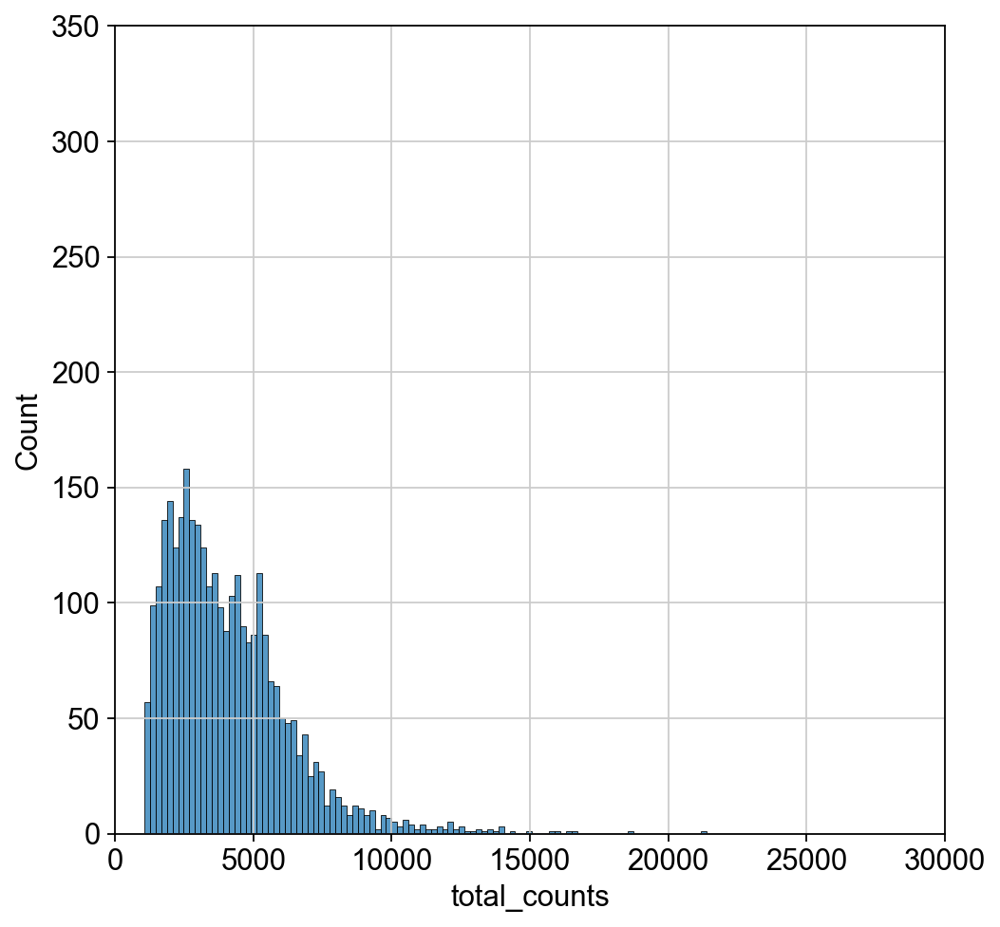

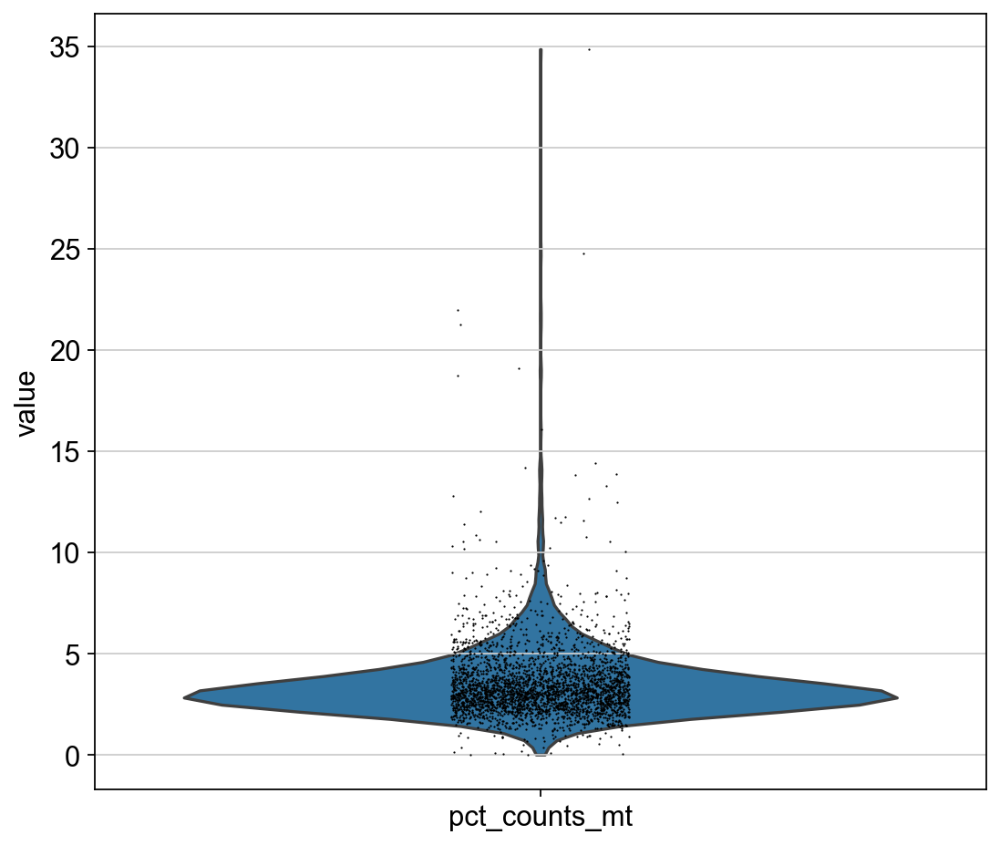

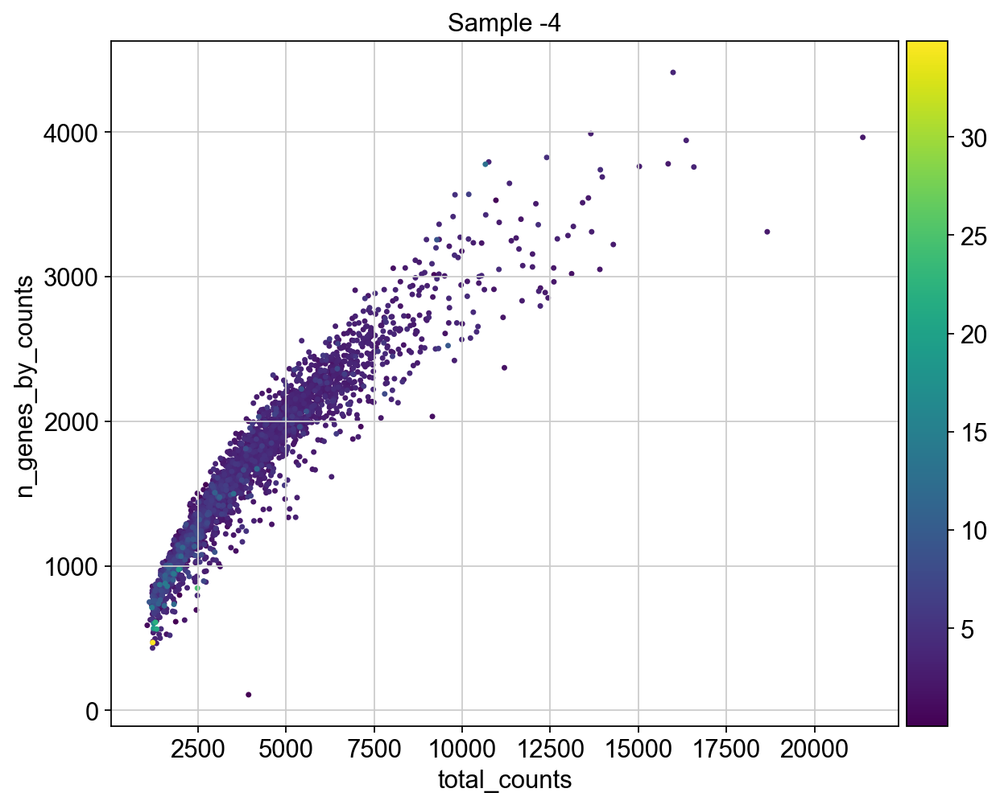

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


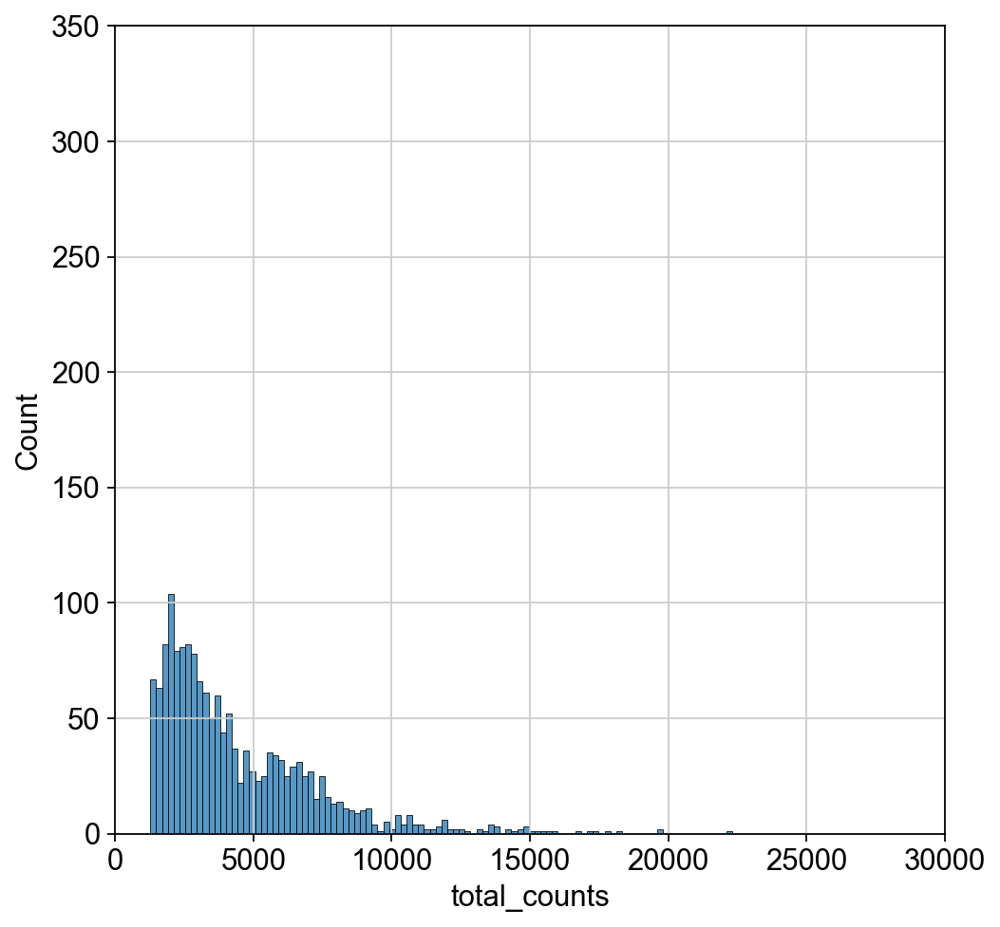

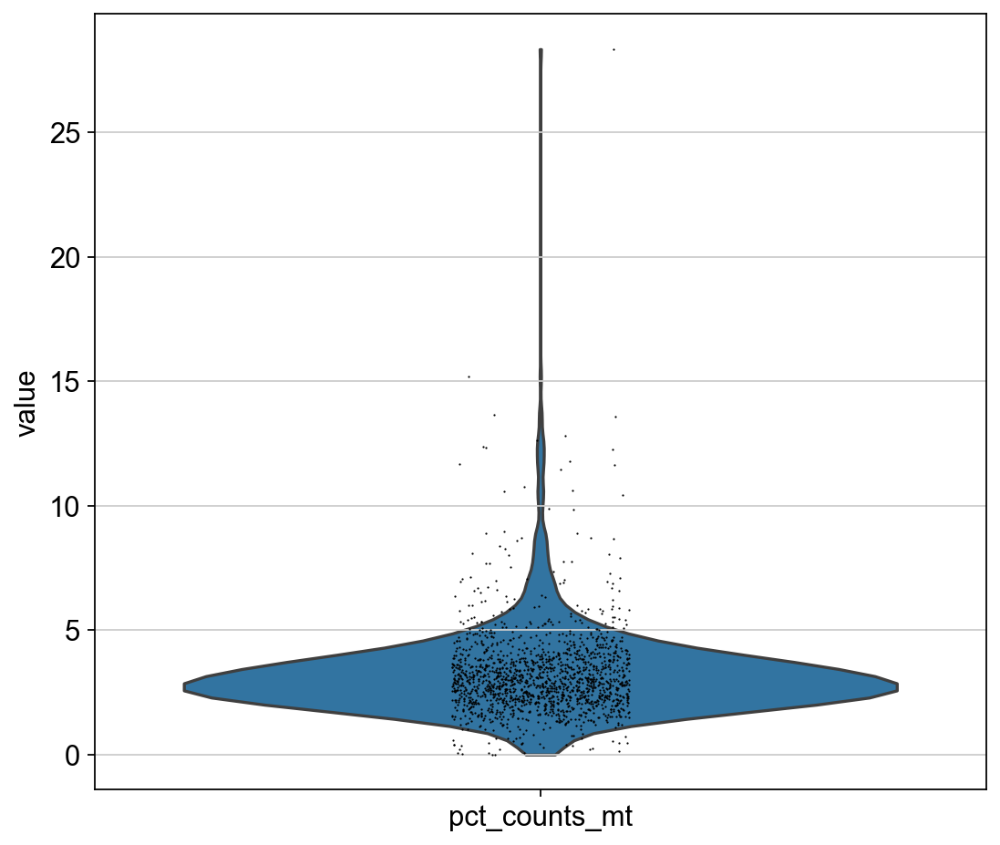

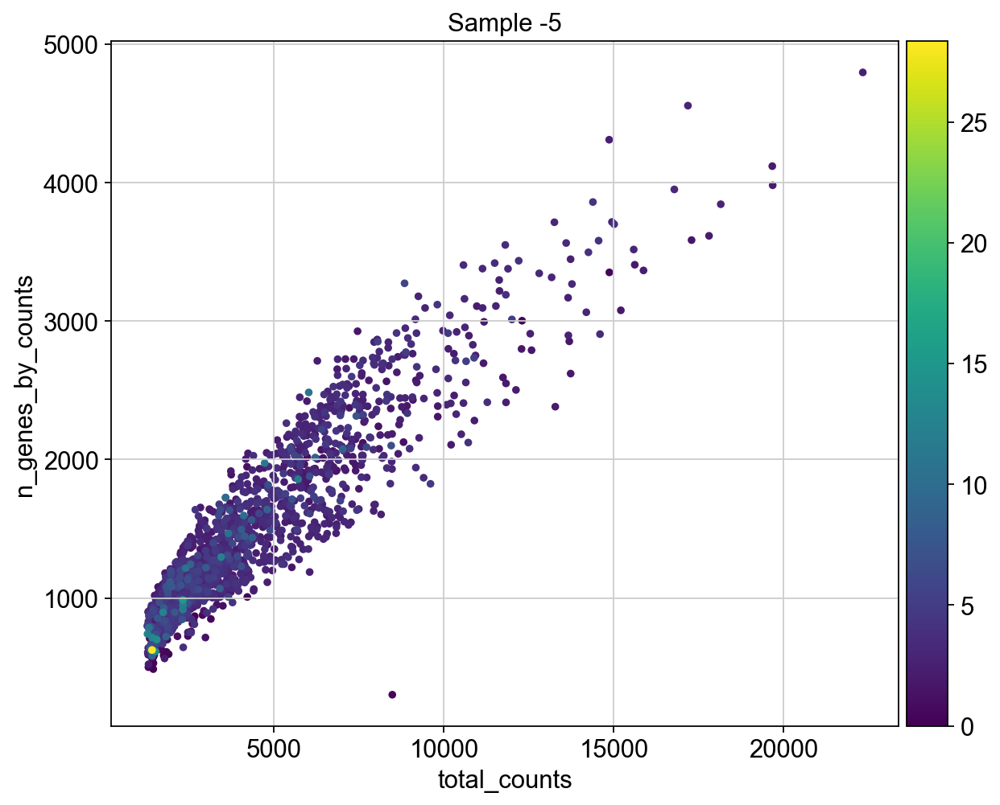

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


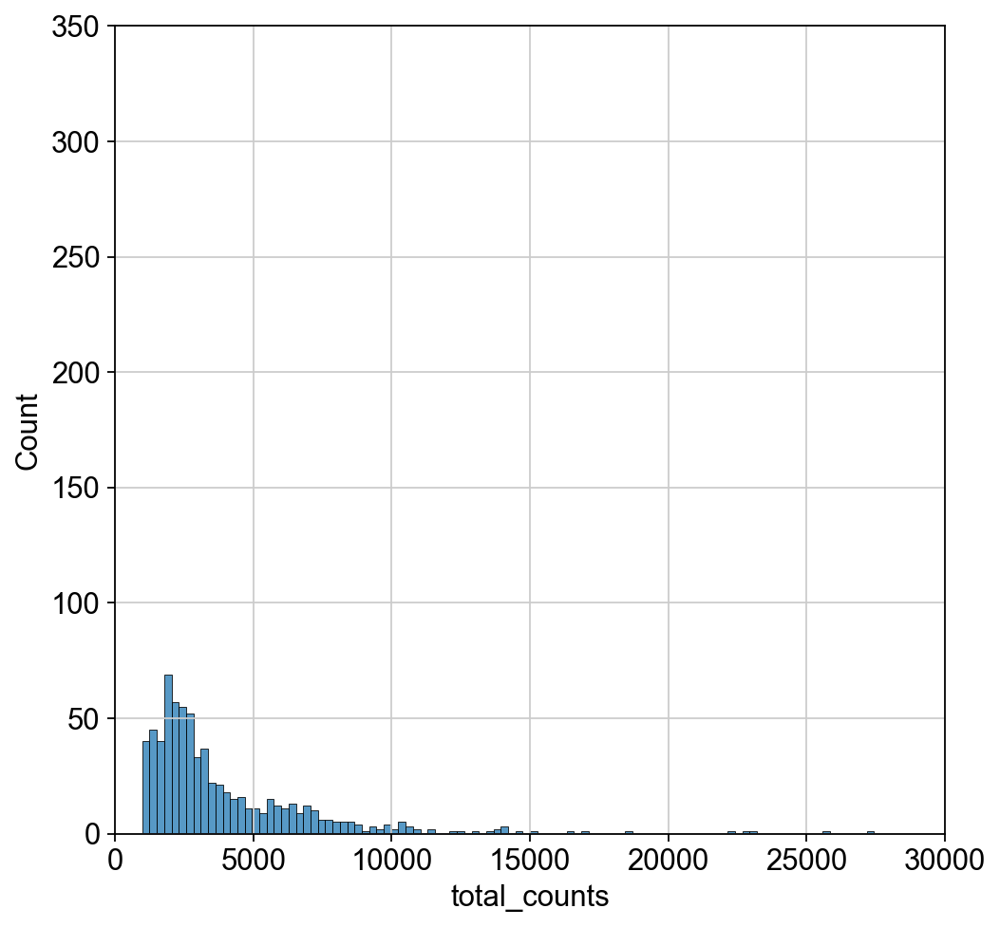

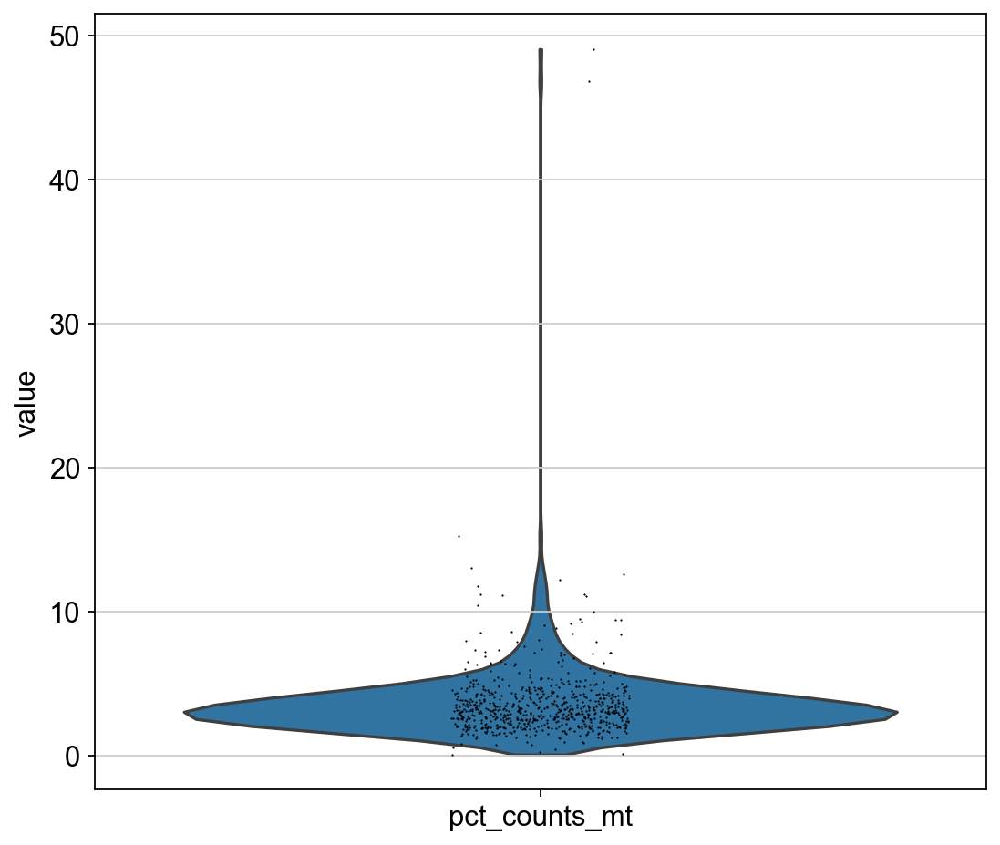

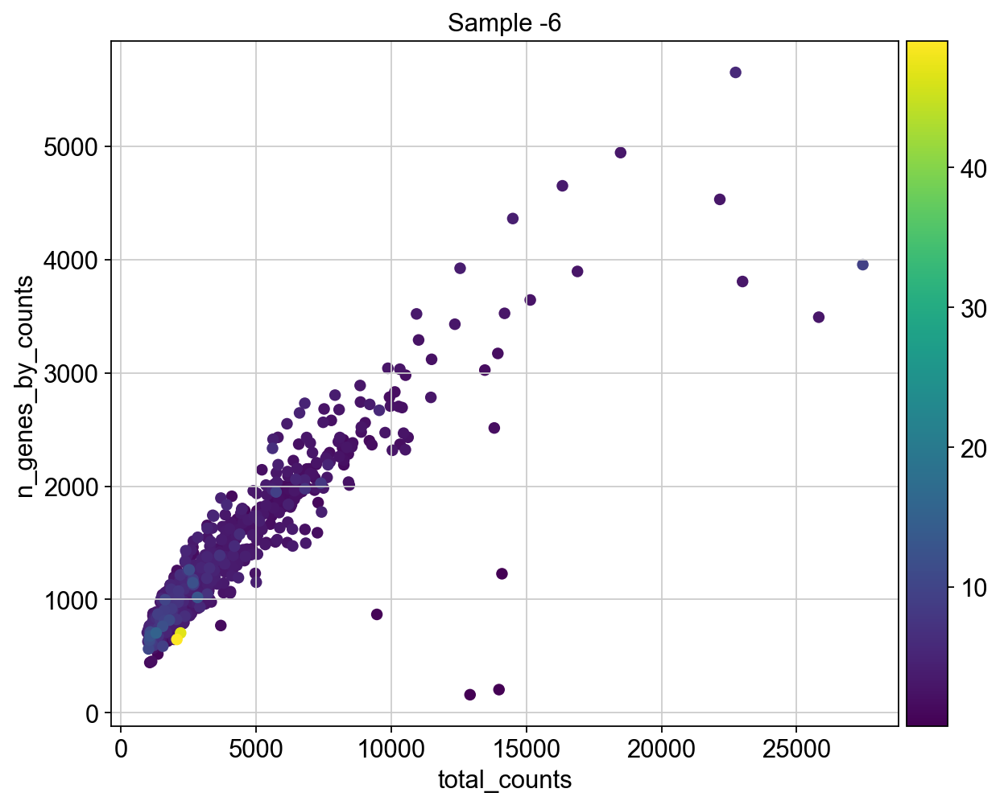

In [23]:
for x in samples: 
    subset_xie = xie_csv[xie_csv.obs.index.str.endswith(x)]
    p1 = sns.histplot(subset_xie.obs["total_counts"], bins=100, kde=False).set(xlim=(0,30000),ylim=(0,350))
    # sc.pl.violin(adata, 'total_counts')
    p2 = sc.pl.violin(subset_xie, "pct_counts_mt",title='Sample '+ x)
    p3 = sc.pl.scatter(subset_xie, "total_counts", "n_genes_by_counts", color="pct_counts_mt", title='Sample '+ x)

## Filtering: 

### Filtering thresholds

Filter by: 
min_genes=300,
max_genes=4000,
max_counts=17000,
pct_counts_mt<8

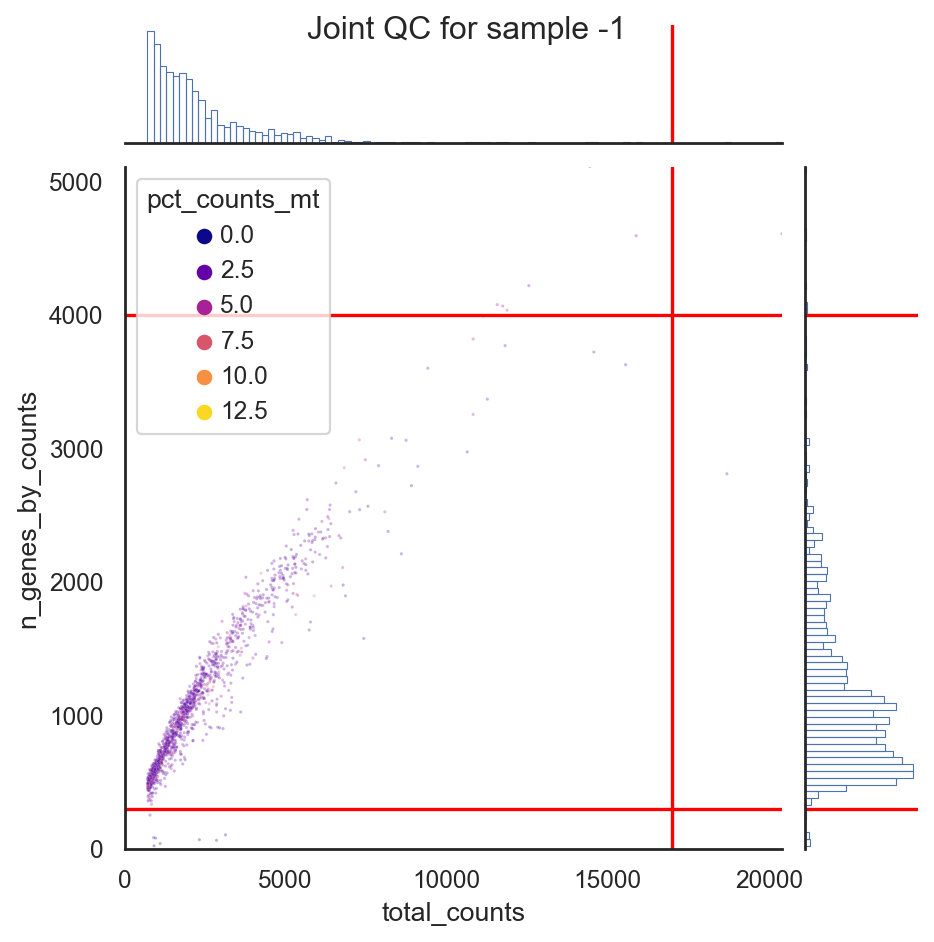

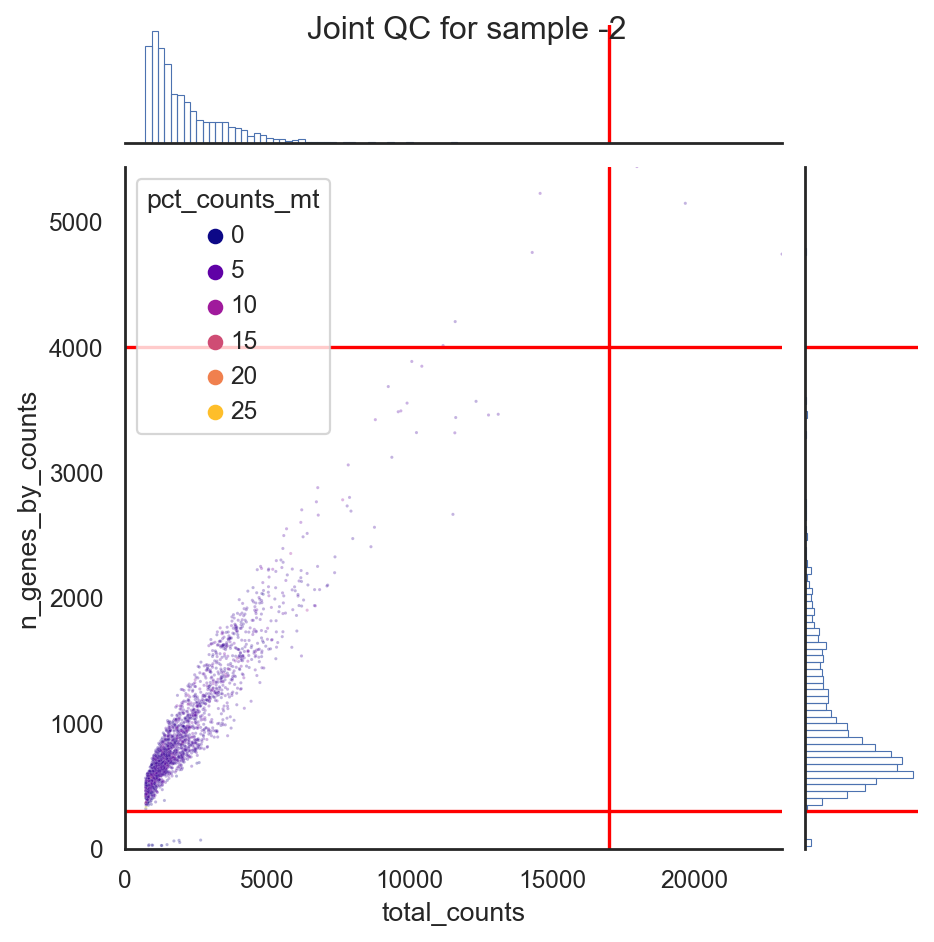

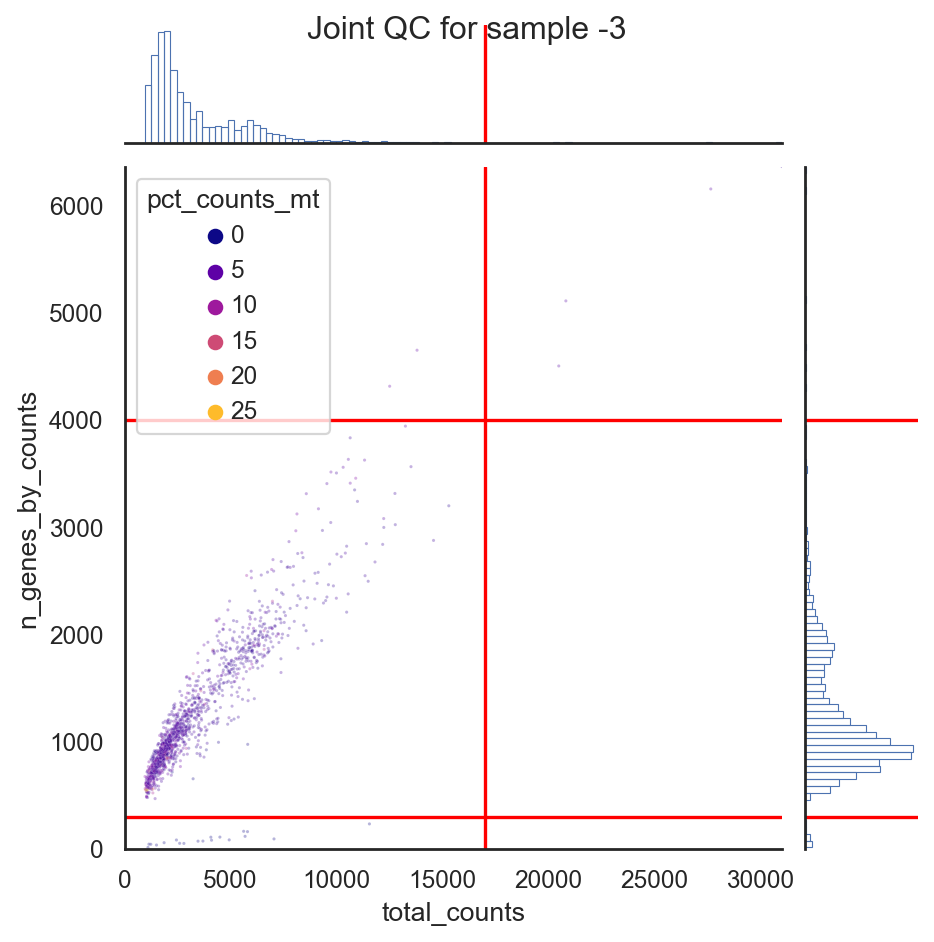

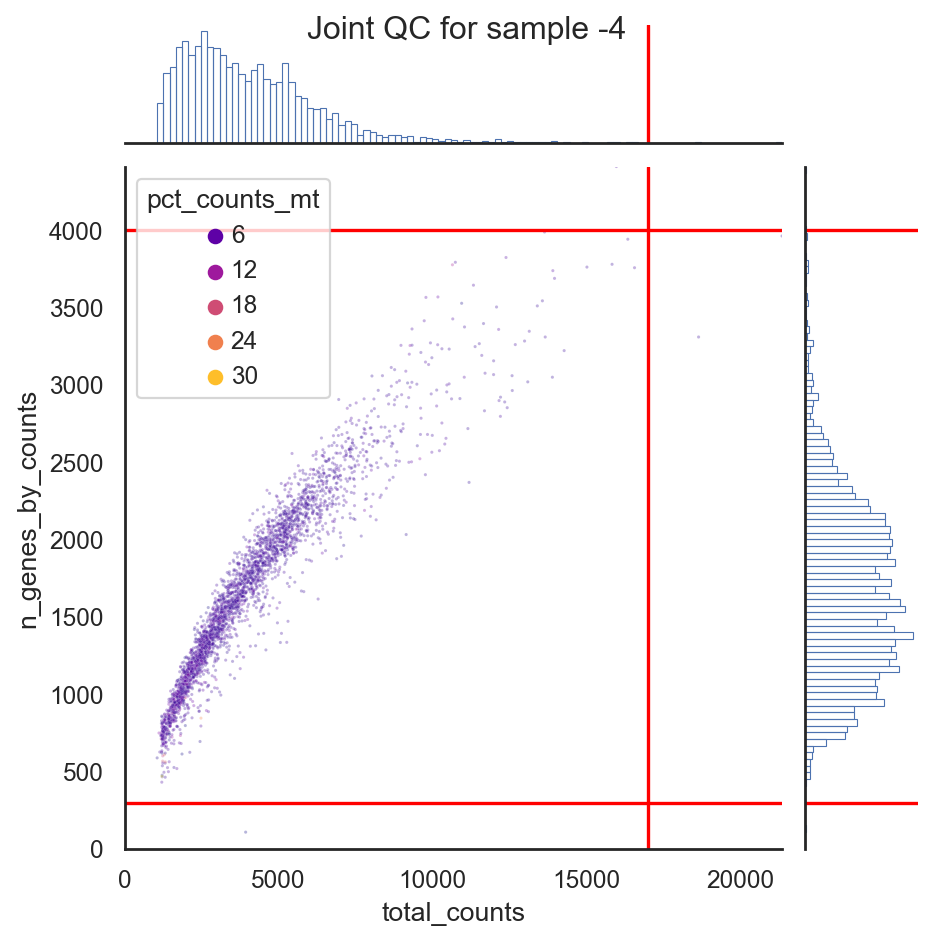

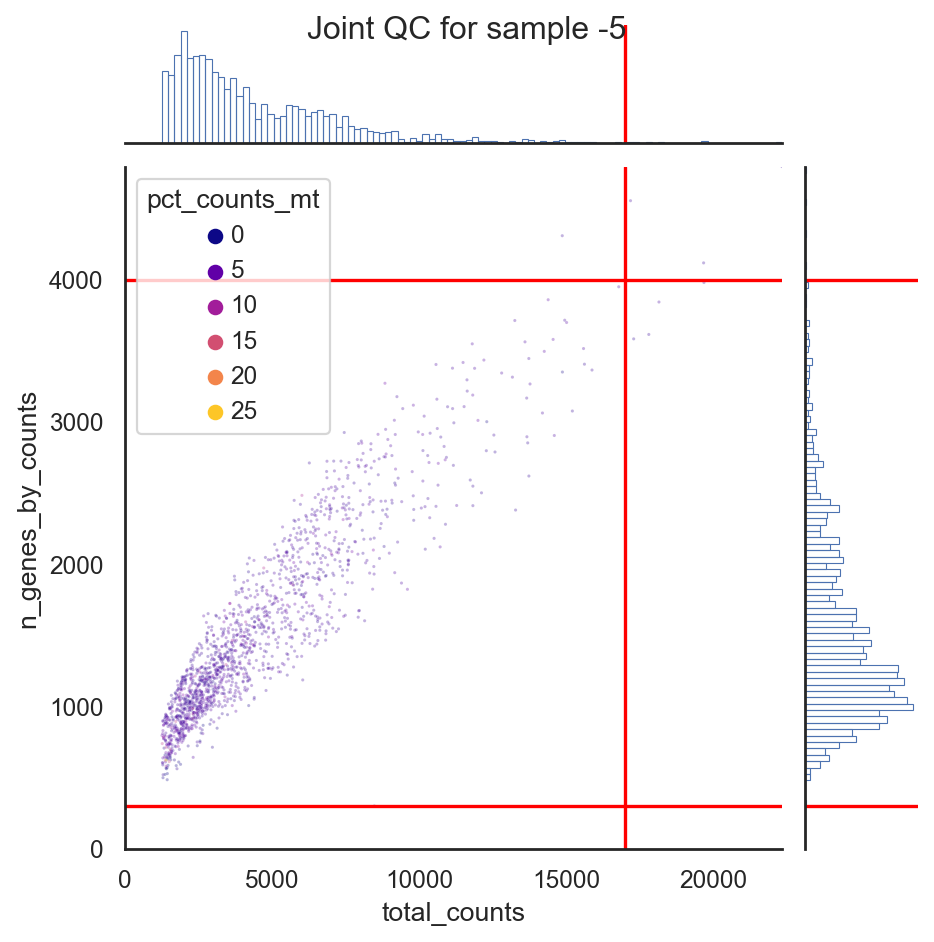

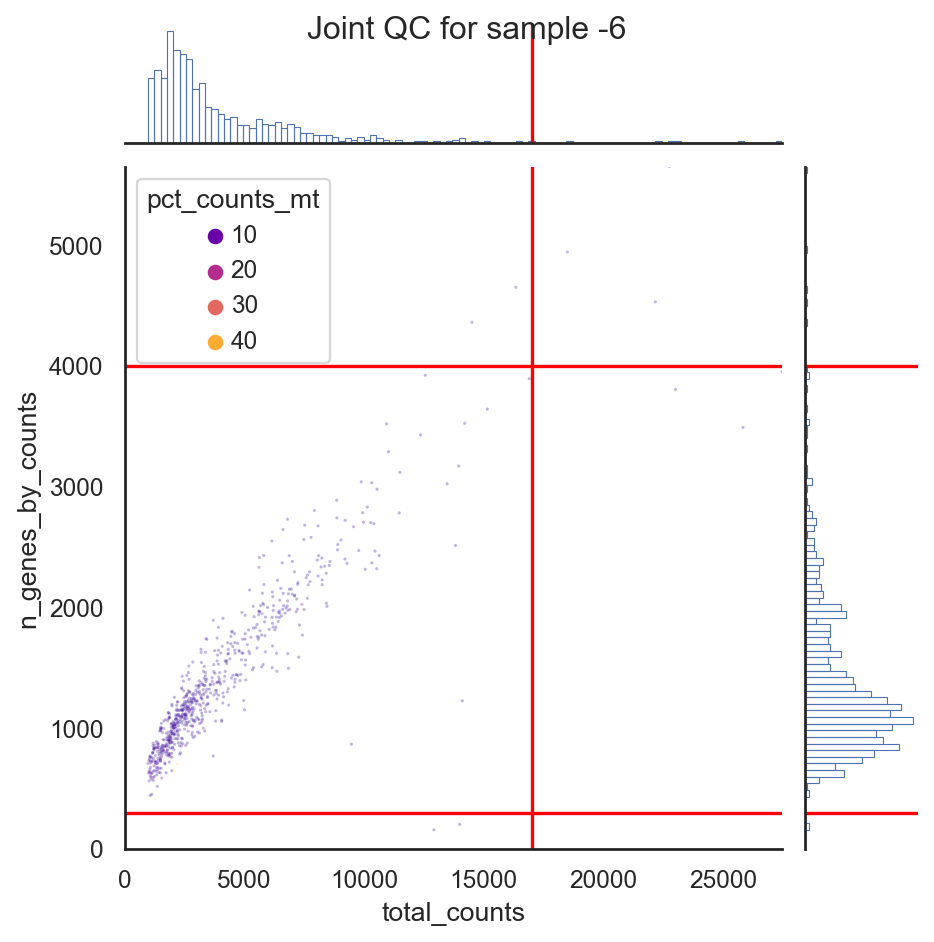

In [24]:
# combined qc plot for each sample with filtering threshold
import sys  
sys.path.insert(0, '/home/p/pohll/Desktop/Masterpraktikum/masterpraktikum_fibrosis_atlas/source')
#sys.path.append("Desktop/Masterpraktikum/masterpraktikum_fibrosis_atlas/source/utils.py")
import utils
for x in samples: 
    subset_xie = xie_csv[xie_csv.obs.index.str.endswith(x)]
    utils.plot_qc_joint(subset_xie, x="total_counts",
                    y='n_genes_by_counts', 
                    hue='pct_counts_mt', 
                    palette='plasma',
                    # marginal_hue="sample",
                    x_threshold=(300, 4000), # total_counts
                    y_threshold=(0, 17000), # n_genes_by_counts
                    title='Joint QC for sample '+ x)

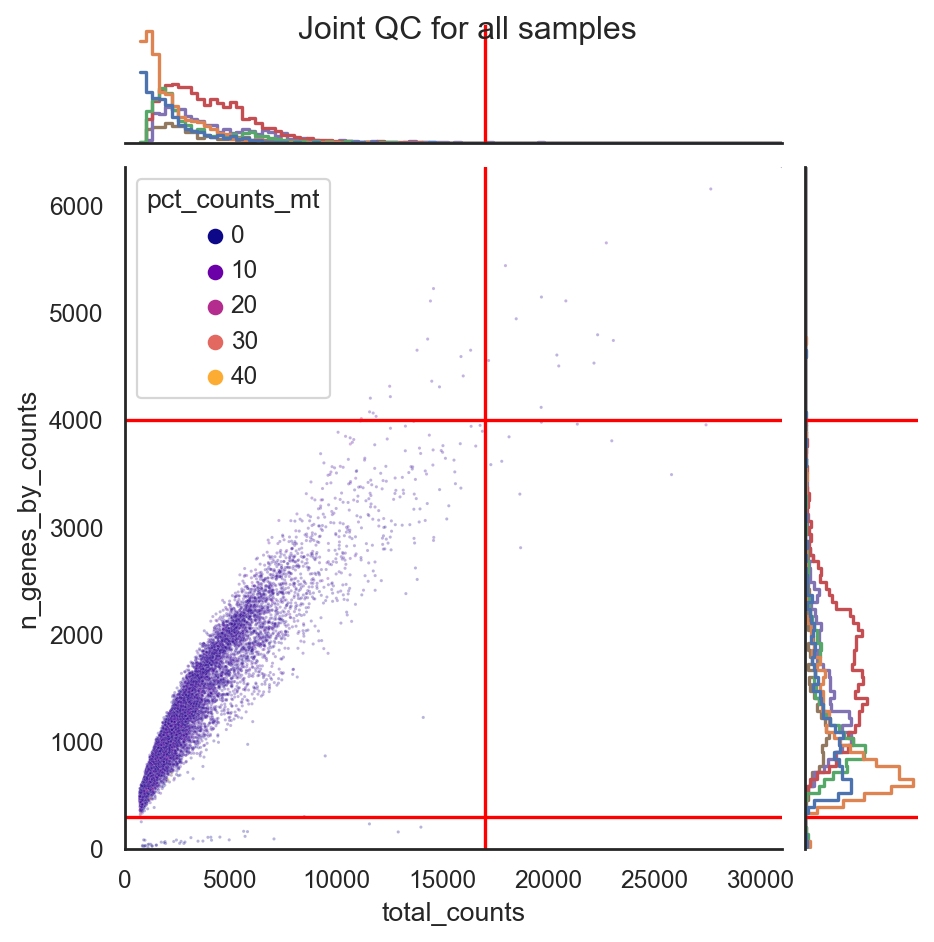

In [25]:
#for all samples combined:
utils.plot_qc_joint(xie_csv, x="total_counts",
                    y='n_genes_by_counts', 
                    hue='pct_counts_mt', 
                    palette='plasma',
                    marginal_hue="sample",
                    x_threshold=(300, 4000), # total_counts
                    y_threshold=(0, 17000), # n_genes_by_counts
                    title='Joint QC for all samples')

### closer look at total counts in range (10000,20000) 

[(10000.0, 20000.0), (0.0, 50.0)]

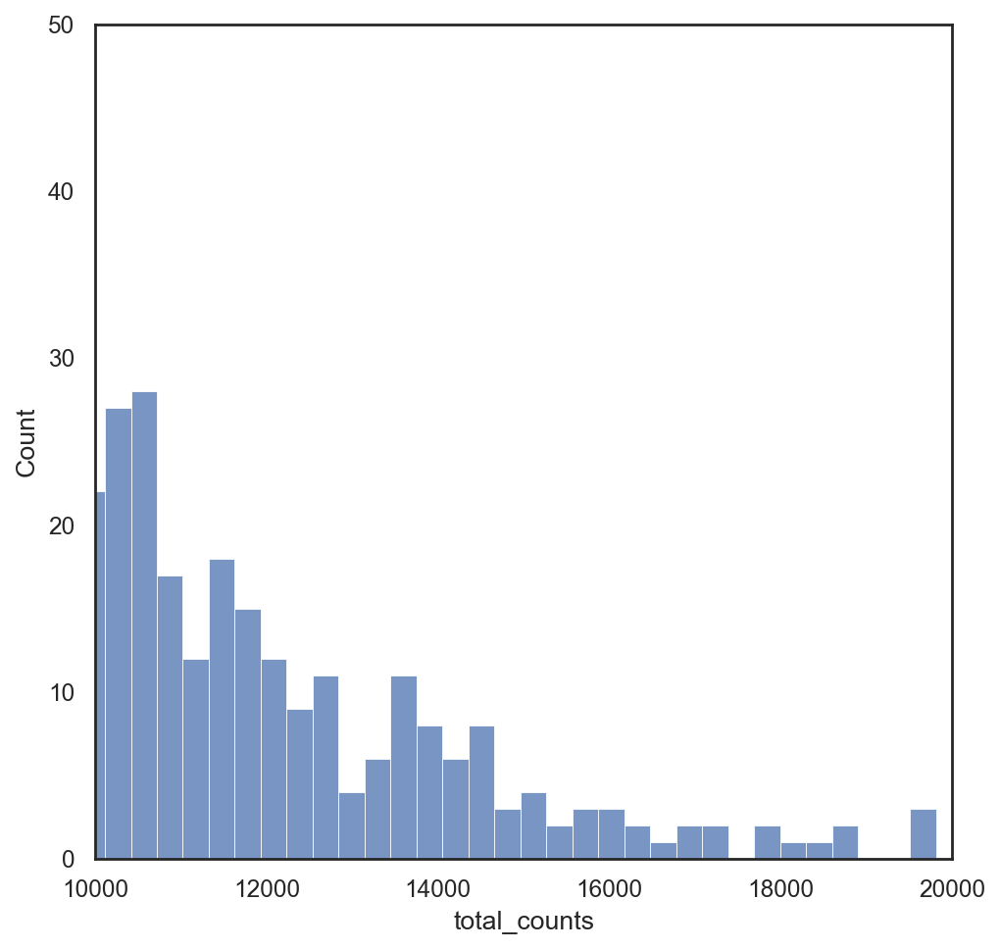

In [31]:
sns.histplot(
    xie_csv.obs, x="total_counts", bins=100, kde=False, legend = True
).set(xlim=(10000,20000), ylim=(0,50))

### comparison to Xie et al. 

xie et al paper: "Cells with percentage of reads mapped on mitochondrial genes > 15% or total number of genes expressed < 300 were removed from further analysis" --> 300 ✅, > 15% --> 30 obs - maybe even 8%? cells already dead? 

filter by:  min_genes=300, max_genes=4000, max_counts=17000
"Cells with a relatively high fraction of mitochondrial counts might for example be involved in respiratory processes and should not be filtered out."- SCBP

### final filtering 

In [27]:
sc.pp.filter_cells(xie_csv, min_genes=300)
sc.pp.filter_cells(xie_csv, max_genes=4000)
sc.pp.filter_cells(xie_csv, max_counts=17000)

In [28]:
print(np.array(xie_csv.obs["pct_counts_mt"] > 15).sum())
print(np.array(xie_csv.obs["pct_counts_mt"] > 10).sum())
print(np.array(xie_csv.obs["pct_counts_mt"] > 8).sum())

30
105
229


In [29]:
print(f"Total number of cells: {xie_csv.n_obs}")
xie_csv.obs["mt_outlier"] = xie_csv.obs["pct_counts_mt"] > 8 
xie_csv = xie_csv[(~xie_csv.obs.mt_outlier)].copy()
print(f"Number of cells after filtering of low quality cells: {xie_csv.n_obs}")

Total number of cells: 10329
Number of cells after filtering of low quality cells: 10100


### data after filtering low quality reads

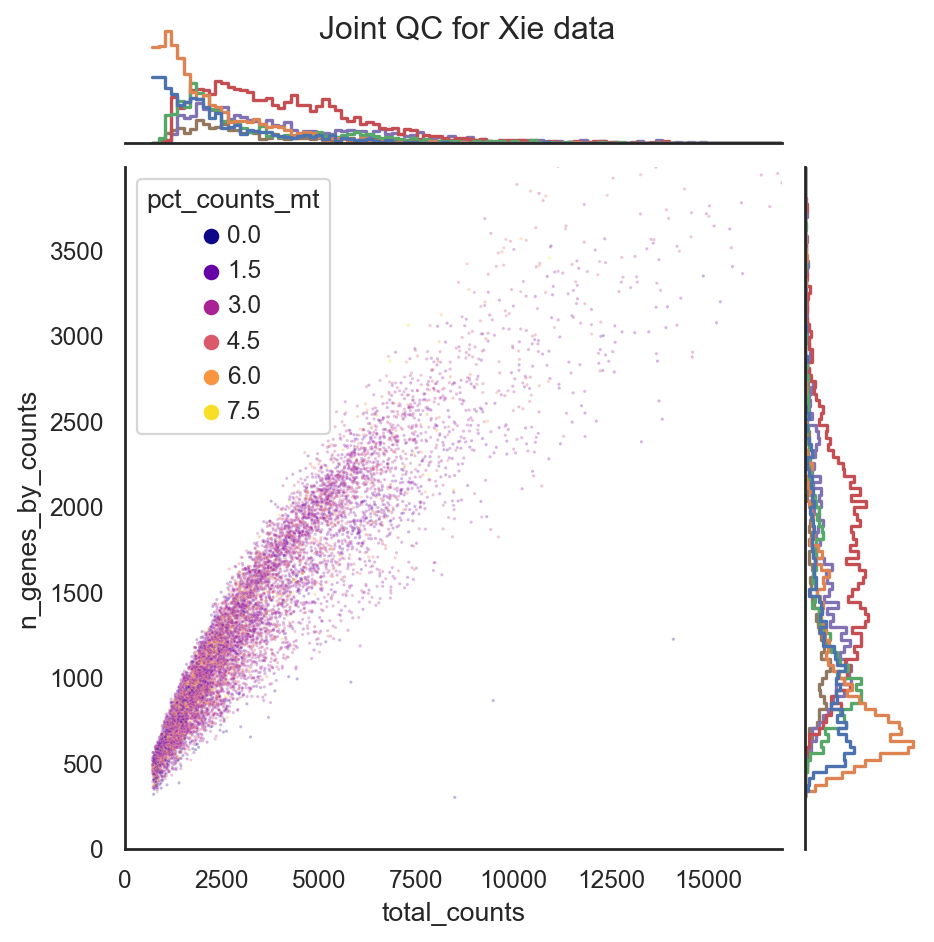

In [30]:
utils.plot_qc_joint(xie_csv, x="total_counts",
                    y='n_genes_by_counts', 
                    hue='pct_counts_mt', 
                    palette='plasma',
                    marginal_hue="sample",
                    x_threshold=(0, np.inf),
                    y_threshold=(0, np.inf),
                    title='Joint QC for Xie data')

In [32]:
xie_temp = xie_csv.copy()

## doublets analysis

### Using R scDblFinder --> python sufficient --> next time only scrublet

In [44]:
%load_ext rpy2.ipython

In [45]:
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

R[write to console]: Attaching SeuratObject

R[write to console]: Lade nötiges Paket: SingleCellExperiment

R[write to console]: Lade nötiges Paket: SummarizedExperiment

R[write to console]: Lade nötiges Paket: MatrixGenerics

R[write to console]: Lade nötiges Paket: matrixStats

R[write to console]: 
Attache Paket: ‘MatrixGenerics’


R[write to console]: Die folgenden Objekte sind maskiert von ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, ro

In [46]:
xie_mat = xie.X.T #input for scDblFinder

- `sce$scDblFinder.score` : the final doublet score (the higher the more likely that the cell is a doublet)
- `sce$scDblFinder.ratio` : the ratio of artificial doublets in the cell’s neighborhood
- `sce$scDblFinder.class` : the classification (doublet or singlet)

In [47]:
%%R -i xie_mat -o doublet_score -o doublet_class

set.seed(123)
sce = scDblFinder(
    SingleCellExperiment(
        list(counts=xie_mat),
    ) 
)
doublet_score = sce$scDblFinder.score
doublet_class = sce$scDblFinder.class

R[write to console]: dimnames(.) <- NULL translated to
dimnames(.) <- list(NULL,NULL)

R[write to console]: Creating ~6060 artificial doublets...

R[write to console]: Dimensional reduction

R[write to console]: Evaluating kNN...

R[write to console]: Training model...

R[write to console]: iter=0, 690 cells excluded from training.

R[write to console]: iter=1, 842 cells excluded from training.

R[write to console]: iter=2, 919 cells excluded from training.

R[write to console]: Threshold found:0.331

R[write to console]: 932 (9.2%) doublets called



In [48]:
xie.obs["scDblFinder_score"] = doublet_score
xie.obs["scDblFinder_class"] = doublet_class
xie.obs.scDblFinder_class.value_counts()

scDblFinder_class
singlet    9168
doublet     932
Name: count, dtype: int64

9293 singlets, 933 doublets, leave doublets in for now 

### Using Scrublet 

 Works best if the input is a raw (unnormalized) counts matri

In [34]:
sc.external.pp.scrublet(xie_csv, batch_key= "sample")

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.37
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 24.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 1.5%


/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.43
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 8.6%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 3.8%


/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.36
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 20.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 1.5%


/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.29
Detected doublet rate = 1.4%
Estimated detectable doublet fraction = 46.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 3.0%


/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.40
Detected doublet rate = 0.5%
Estimated detectable doublet fraction = 9.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.2%


/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.29
Detected doublet rate = 1.0%
Estimated detectable doublet fraction = 17.3%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 6.0%


In [35]:
xie_csv # --> 'doublet_score', 'predicted_doublet'

AnnData object with n_obs × n_vars = 10100 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'sample', 'n_genes', 'n_counts', 'mt_outlier', 'doublet_score', 'predicted_doublet'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'scrublet'

In [36]:
xie_temp

AnnData object with n_obs × n_vars = 10100 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'sample', 'n_genes', 'n_counts', 'mt_outlier'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

# Normalization 

In [37]:
xie = xie_csv
scales_counts = sc.pp.normalize_total(xie, target_sum=None, inplace=False)
# log1p transform
xie.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

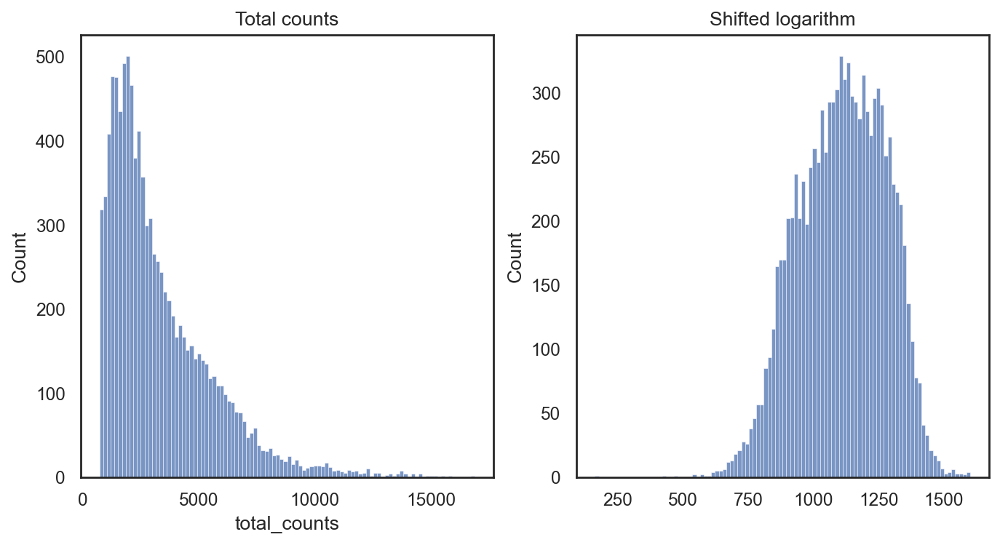

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(xie.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(xie.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

In [40]:
xie.X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

# Feature Selection 

exclude uninformative genes
- use deviance for feature selection which works on raw counts. 
- can be computed in closed form and quantifies whether genes show a constant expression profile across cells as these are not informative
- Genes with constant expression: multinomial null model
- Highly informative genes across cells: high deviance value, do not fit null model 
- According to the deviance values, the method then ranks all genes and obtains only highly deviant genes.

## 1. Using R scry -->  python sc.pp.highly_variable_genes sufficient 

In [5]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

In [6]:
load_ext rpy2.ipython

In [7]:
%%R
library(scry)

save the AnnData object in our R environment

In [8]:
ro.globalenv["xie"] = xie

In [26]:
#%%R -i xie
#xie

NotImplementedError: Conversion 'py2rpy' not defined for objects of type '<class 'anndata._core.anndata.AnnData'>'

In [9]:
%%R
sce = devianceFeatureSelection(xie, assay="X")

In [10]:
binomial_deviance = ro.r("rowData(sce)$binomial_deviance").T

sort the vector an select the top 4,000 highly deviant genes and save them as an additional column in .var as ‘highly_deviant’. 
save the computed binomial deviance in case we want to sub-select a different number of highly variable genes afterwards.

In [11]:
idx = binomial_deviance.argsort()[-4000:]
mask = np.zeros(xie.var_names.shape, dtype=bool)
mask[idx] = True

xie.var["highly_deviant"] = mask
xie.var["binomial_deviance"] = binomial_deviance

In [12]:
xie.var["highly_deviant"].value_counts()

highly_deviant
False    23998
True      4000
Name: count, dtype: int64

In [13]:
# setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
xie.var["highly_variable"] = xie.var["highly_deviant"]

In [18]:
#xie.X = xie.layers["log1p_norm"]

## 2. Using sc.pp.highly_variable_genes

In [41]:
sc.pp.log1p(xie)

In [51]:
xie_2_copy = xie.copy()

In [53]:
xie_2_copy.X = xie_temp.X

In [55]:
xie_2_copy.X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [58]:
xie_2_copy.write('/home/p/pohll/Desktop/MP/data/xie_X_raw_counts_leonie.h5ad')

In [59]:
xie_2_copy

AnnData object with n_obs × n_vars = 10100 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'sample', 'n_genes', 'n_counts', 'mt_outlier', 'doublet_score', 'predicted_doublet'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'scrublet', 'log1p'
    layers: 'log1p_norm'

In [52]:
sc.pp.highly_variable_genes(xie, min_mean=0.0120, max_mean=3, min_disp=0.5)

In [53]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

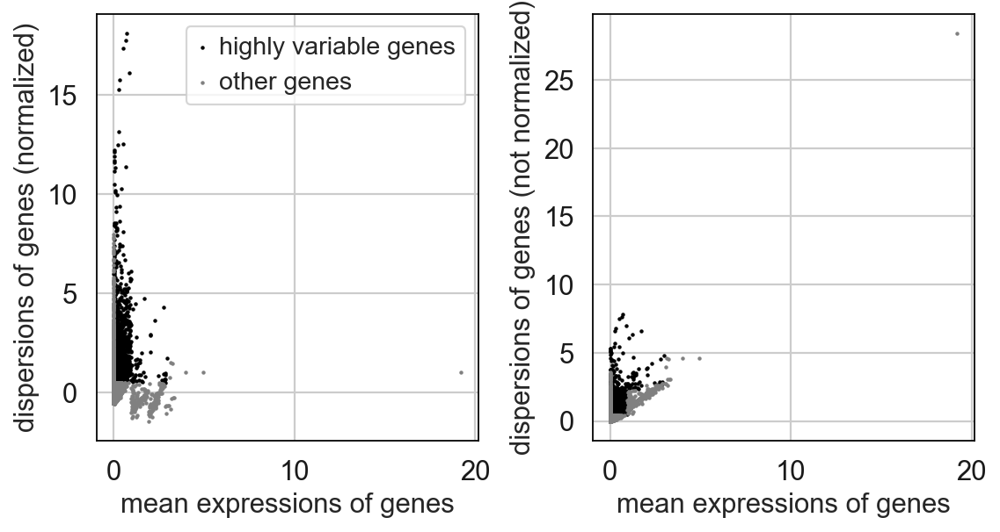

In [54]:
sc.pl.highly_variable_genes(xie)

# Dim Reduction + UMAP

## 1. PCA 

In [55]:
sc.tl.pca(xie, svd_solver='arpack', use_highly_variable=True )

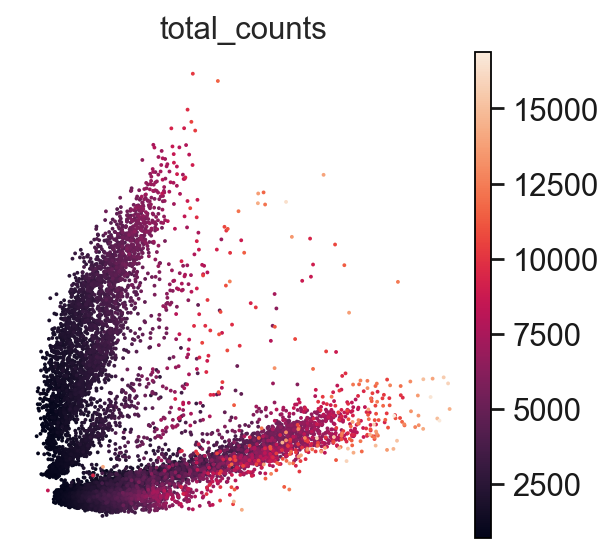

In [56]:
sc.pl.pca(xie, color='total_counts')

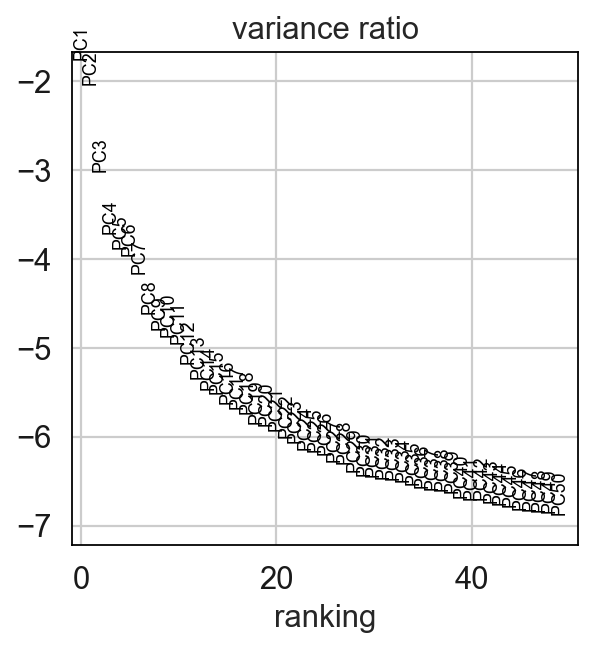

In [57]:
sc.pl.pca_variance_ratio(xie, log=True, n_pcs = 50) # später rufer neighbours/UMAP mit verschiedenen PCs auf 

## 2. UMAP

In [58]:
sc.pp.neighbors(xie,n_pcs = 30, n_neighbors = 20) 
sc.tl.umap(xie)

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/

In [59]:
plt.rcParams['figure.figsize'] = (7, 7)

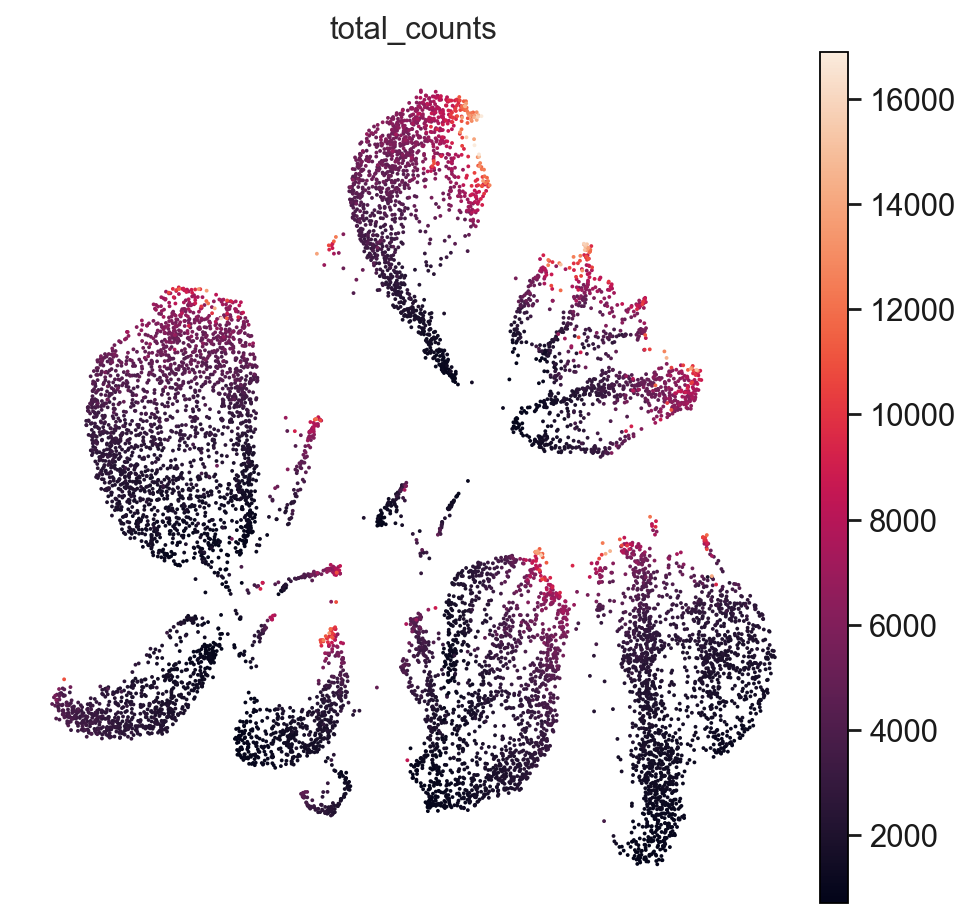

In [60]:
sc.pl.umap(xie, color="total_counts")

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


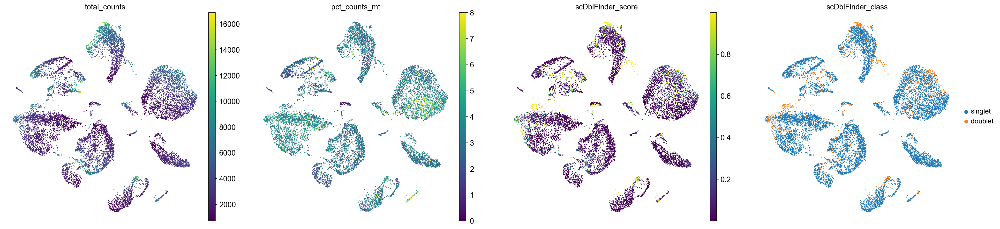

In [88]:
sc.pl.umap(
    xie,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class"],
)
# todo doublets + hohe counts nochmal anschaune --> rausfiltern

In [66]:
xie.obs['predicted_doublet'].astype(str).astype('category')

AAACCTGAGGACATTA-1    False
AAACCTGCAGTCGTGC-1    False
AAACCTGCATGAAGTA-1    False
AAACCTGTCTCGCATC-1    False
AAACGGGTCCTAGAAC-1    False
                      ...  
TTTACTGTCTGGCGAC-6    False
TTTGCGCCAATGAAAC-6    False
TTTGGTTCAGTAGAGC-6    False
TTTGTCAAGCTACCGC-6    False
TTTGTCACATCGGGTC-6    False
Name: predicted_doublet, Length: 10099, dtype: category
Categories (2, object): ['False', 'True']

TypeError: The numpy boolean negative, the `-` operator, is not supported, use the `~` operator or the logical_not function instead.

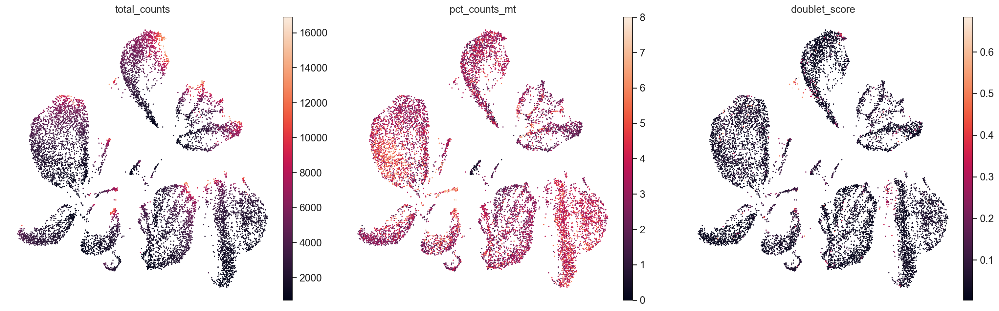

In [67]:
sc.pl.umap(
    xie,
    color=["total_counts", "pct_counts_mt", "doublet_score", "predicted_doublet"]
)

In [68]:
xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie_pp_qc.h5ad')

# Analyze Batch effects

In [69]:
xie.obs['sample']=xie.obs.index.str.split('-').str[1]
xie.obs['cond']='control'
xie.obs.loc[xie.obs['sample'].isin(['4', '5', '6']), 'cond']='bleo'

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


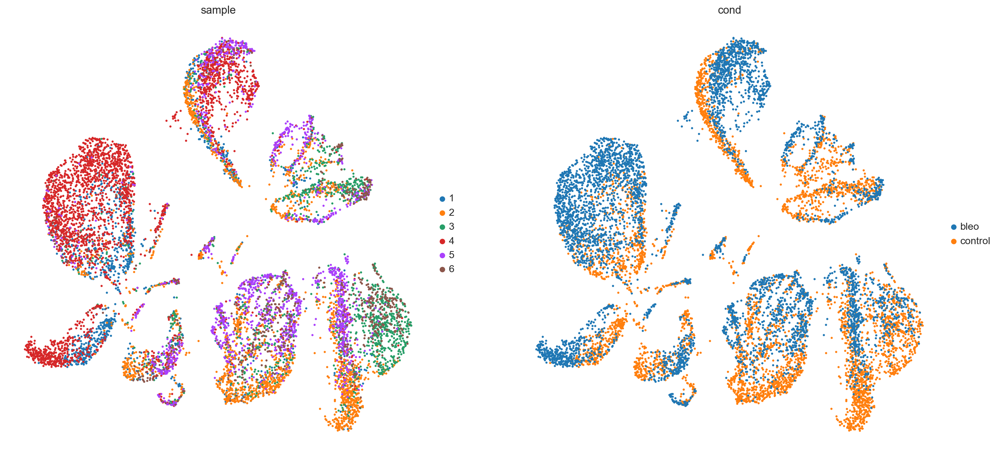

In [70]:
plt.rcParams['figure.figsize'] = (10, 10)
sc.pl.umap(xie, color=['sample', 'cond'], size=30)

- fewer contol cells than bleo cells, makes sense since in total 1943 (normal)+ 3386 (fibrotic) cells. 
- batch effect: each batch only "represents" one condition - bleo or normal 

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


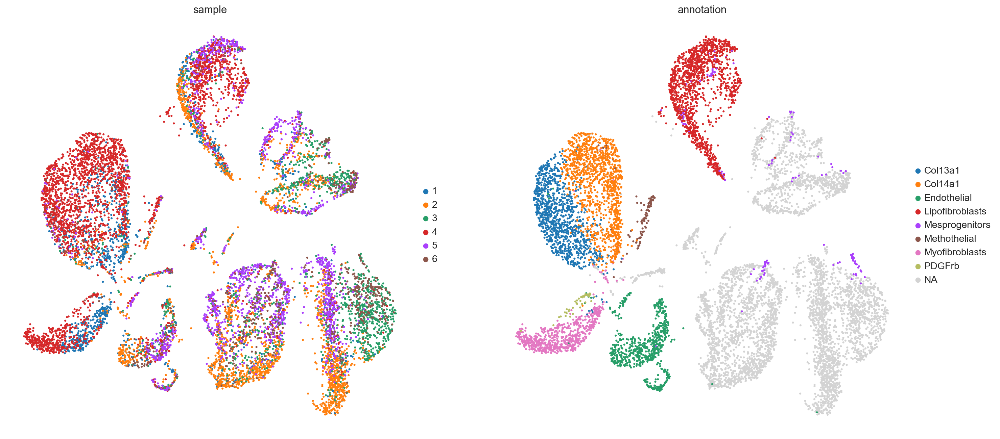

In [71]:
plt.rcParams['figure.figsize'] = (10, 10)
sc.pl.umap(xie, color=['sample',"annotation"], size=30)

only small shift between batches 